# Curse of Dimensionality

Checkout this video: https://youtu.be/ToGuhynu-No.

**Problems with higher dimensional data (sparsity):**

- Performance decreases
- Computation increases

To solve the problem, there is a technique **Dimensionality Reduction**, reduce the dimenstion. There are two techniques to reduce dimenstion

- Feature Selection
    - Forward Selection
    - Backward Elemination
    - Bidirectional Elemination
- Feature Extraction
    - PCA (Principal Component Analysis)
    - LDA (Linear Discreament Analysis)
    - tSne
    
# PCA

**PCA is a technique which can transform a higher dimensional data to a lower dimensional data keeping the asence of the data.** 

**Benifits:**

- faster execution of algorithm
- visualization

## Geometric Instition

| No. of rooms | No. of grocery shops | price (L) |
| :--: | :--: | :--: |
| 3 | 2 | 60 |
| 4 | 0 | 130 |
| 5 | 6 | 170 |
| 2 | 10 | 90 |

This is a dataset and let's assume that you dont have domain knowledge based on the dataset. And you have to remove one independent variable by doing feature selection. Then which independent variable will you remove? For that time, you will plot a scatter plot where x-axis will belong to "no. of rooms" and y-axis will belong to "no of grocery shops". You will notice that the spread according to x-axis is larger than y-axis. That means most of the houses with different number of rooms have same or kine of same number of grocery shops. So you will remove "no. of grocery shops" because it will not create very much impact on the model to predict price.

Now slighly change the problem. Now you have a dataset where "no. of rooms" and "no. of washrooms" are independent variables and "price" is dependent variable. If you want to remove one column by using feature selection technique, then you can't do. Why? When you will plot the data where x-axis is "no. of rooms" and y-axis is "no. of washrooms", you can see a linear relationship between these two independent variables because "no. of washrooms" will increase with the increase of "no. of rooms". Then the spread of data on x-axis almost similar to the spread of the data on y-axis. So that time you can't do feature selection. But you have to remove one column. What will you do? That time you will do feature extraction technique. You will create completly a new independent variable named "size of the house" where "size of the house" = size of the rooms + size of the washrooms. And after this you will remove both "no. of rooms" and "no. of washrooms" these two columns and you data will become to 2d from 3d.

Now see the videos

- Part 1: https://www.youtube.com/watch?v=iRbsBi5W0-c&t=57s
- Part 2: https://youtu.be/tXXnxjj2wM4
- Part 3: 

Or **you can follow these blogs**:

- https://medium.com/the-data-league/the-mathematics-and-intuitions-of-principal-component-analysis-pca-using-truncated-singular-b4944e5e95e6
- https://towardsdatascience.com/principal-component-analysis-math-and-intuition-post-1-d44bf32844f3
- https://www.visiondummy.com/2014/04/geometric-interpretation-covariance-matrix

- Can see the linear transformations by matrix: https://www.geogebra.org/m/YCZa8TAH

In [ ]:
"""
If I apply one matrix on a co-ordinate system, then the direction as well as magnitude of vectors will change. 
This is called linear transformation.
"""

### From Scratch Without Using Scikit Learn

In [4]:
import numpy as np
import pandas as pd

np.random.seed(23)

mu_vec1 = np.array([0, 0, 0])
cov_mat1 = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 1]])
class1_sample = np.random.multivariate_normal(mu_vec1, cov_mat1, 20)

df = pd.DataFrame(class1_sample, columns = ["feature1", "feature2", "feature3"])
df["target"] = 1

mu_vec2 = np.array([1, 1, 1])
cov_mat2 = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 1]])
class2_sample = np.random.multivariate_normal(mu_vec2, cov_mat2, 20)

df1 = pd.DataFrame(class2_sample, columns = ["feature1", "feature2", "feature3"])

df1["target"] = 0

df = df.append(df1, ignore_index = True)

df = df.sample(40)

In [5]:
df.head()

,feature1,feature2,feature3,target
2,-0.367548,-1.137460,-1.322148,1
34,0.177061,-0.598109,1.226512,0
14,0.420623,0.411620,-0.071324,1
11,1.968435,-0.547788,-0.679418,1
12,-2.506230,0.146960,0.606195,1


In [6]:
import plotly.express as px

# y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x = df["feature1"], y = df["feature2"], z = df["feature3"], color = df["target"].astype("str"))

fig.update_traces(
    maker = dict(size=12, line = dict(width = 2, color = "DarkSlateGrey")),
    selector = dict(mode = "makers")
)

fig.show()

In [7]:
# Step 1 - Apply standard scaling (mean centaring)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

df.iloc[:, :3] = scaler.fit_transform(df.iloc[:, :3])

In [8]:
# Step 2 - Find Covariance Matrix
covariance_matrix = np.cov([df.iloc[:, 0], df.iloc[:, 1], df.iloc[:, 2]])
print("Covariance Matrix:\n", covariance_matrix)

Covariance Matrix:
 [[1.02564103 0.20478114 0.080118  ]
 [0.20478114 1.02564103 0.19838882]
 [0.080118   0.19838882 1.02564103]]


In [9]:
# Step 3 - Finding Eigen Values & Eigen Vectors
eigen_values, eigen_vectors = np.linalg.eig(covariance_matrix)
eigen_values

array([1.3536065 , 0.94557084, 0.77774573])

In [10]:
eigen_vectors

array([[-0.53875915, -0.69363291,  0.47813384],
       [-0.65608325, -0.01057596, -0.75461442],
       [-0.52848211,  0.72025103,  0.44938304]])

Populating the interactive namespace from numpy and matplotlib


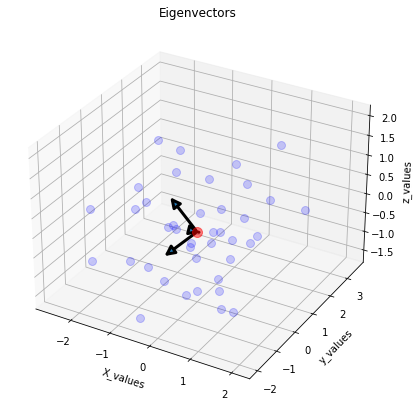

In [13]:
%pylab inline

from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d
from matplotlib.patches import FancyArrowPatch
import warnings
warnings.filterwarnings("ignore")

class Arrow3D(FancyArrowPatch):
    def __init__(self, xs, ys, zs, *args, **kwargs):
        FancyArrowPatch.__init__(self, (0, 0), (0, 0), *args, **kwargs)
        self._verts3d = xs, ys, zs
        
    def draw(self, renderer):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, renderer.M)
        self.set_positions((xs[0], ys[0]), (xs[1], ys[1]))
        FancyArrowPatch.draw(self, renderer)
        
fig = plt.figure(figsize = (7, 7))
ax = fig.add_subplot(111, projection = '3d')

ax.plot(df["feature1"], df["feature2"], df["feature3"], "o", markersize = 8, color = "blue", alpha = 0.2)
ax.plot(
    [df["feature1"].mean()], [df["feature2"].mean()], [df["feature3"].mean()], "o", markersize = 10, 
    color = "red", alpha = 0.5
       )

for v in eigen_vectors.T:
    a = Arrow3D(
        [df["feature1"].mean(),v[0]],
        [df["feature2"].mean(), v[1]], 
        [df["feature3"].mean(), v[2]], 
        mutation_scale = 20, 
        lw = 3, 
        arrowstyle = "-|>"
    )
    ax.add_artist(a)
    
ax.set_xlabel("X_values")
ax.set_ylabel("y_values")
ax.set_zlabel("z_values")

plt.title("Eigenvectors")

plt.show()

In [14]:
pc = eigen_vectors[0:2]
pc

array([[-0.53875915, -0.69363291,  0.47813384],
       [-0.65608325, -0.01057596, -0.75461442]])

In [15]:
transformed_df = np.dot(df.iloc[:, :3], pc.T)

new_df = pd.DataFrame(transformed_df, columns = ["PC1", "PC2"])
new_df["target"] = df["target"].values
new_df.head()

,PC1,PC2,target
0,0.599433,1.795862,1
1,1.056919,-0.212737,0
2,-0.271876,0.498222,1
3,-0.621586,0.023110,1
4,1.567286,1.730967,1


In [16]:
new_df["target"] = new_df["target"].astype("str")

fig = px.scatter(
    x = new_df["PC1"],
    y = new_df["PC2"],
    color = new_df["target"],
    color_discrete_sequence = px.colors.qualitative.G10
)

fig.update_traces(
    marker = dict(size = 12, line = dict(width = 2, color = "DarkSlateGrey")),
    selector = dict(mode = "markers")
)

fig.show()

### Practical Example Using Scikit Learn

In [48]:
import time

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA

from sklearn.neighbors import KNeighborsClassifier

import warnings

pd.options.mode.chained_assignment = None
warnings.filterwarnings("ignore")

In [49]:
df = pd.read_csv("../Datasets/Digit_Recognizer/train.csv")
df.shape

(42000, 785)

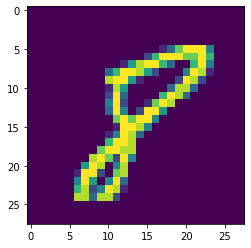

In [50]:
# from 2nd column because 1st column is "label"
plt.imshow(df.iloc[18306, 1:].values.reshape(28, 28))
plt.show()

In [51]:
X = df.iloc[:, 1:]
y = df.iloc[:, 0]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

X_train.shape

(33600, 784)

In [52]:
knn    = KNeighborsClassifier()

knn.fit(X_train, y_train)

start = time.time()
y_pred = knn.predict(X_test)
print(f"Time took: {time.time() - start}")

Time took: 6.339996576309204


In [53]:
accuracy_score(y_test, y_pred)

0.9648809523809524

In [54]:
# Applying PCA
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

In [55]:
pca = PCA(n_components = 100)  # will create 100 Principle Components

X_train_trf = pca.fit_transform(X_train)
X_test_trf  = pca.transform(X_test)

X_train_trf.shape

(33600, 100)

In [56]:
knn    = KNeighborsClassifier()

knn.fit(X_train_trf, y_train)

start = time.time()
y_pred = knn.predict(X_test_trf)
print(f"Time took: {time.time() - start}")

Time took: 4.11311936378479


In [57]:
accuracy_score(y_test, y_pred)

0.9544047619047619

In [58]:
accuracy_score_list = []

for i in range(1, 50):
    pca         = PCA(n_components = i)
    
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf  = pca.transform(X_test)
    
    knn         = KNeighborsClassifier()

    knn.fit(X_train_trf, y_train)

    y_pred      = knn.predict(X_test_trf)
    
    score = accuracy_score(y_test, y_pred)
    accuracy_score_list.append(score)
    
    print(f"Accuracy score for component number {i}: {score}")

Accuracy score for component number 1: 0.25785714285714284
Accuracy score for component number 2: 0.32416666666666666
Accuracy score for component number 3: 0.5104761904761905
Accuracy score for component number 4: 0.6661904761904762
Accuracy score for component number 5: 0.7376190476190476
Accuracy score for component number 6: 0.8228571428571428
Accuracy score for component number 7: 0.8432142857142857
Accuracy score for component number 8: 0.8728571428571429
Accuracy score for component number 9: 0.8864285714285715
Accuracy score for component number 10: 0.9055952380952381
Accuracy score for component number 11: 0.9107142857142857
Accuracy score for component number 12: 0.9184523809523809
Accuracy score for component number 13: 0.9280952380952381
Accuracy score for component number 14: 0.9352380952380952
Accuracy score for component number 15: 0.9379761904761905
Accuracy score for component number 16: 0.939047619047619
Accuracy score for component number 17: 0.939047619047619
Accura

In [61]:
max_accuracy_score = max(accuracy_score_list)
n_component_value  = accuracy_score_list.index(max_accuracy_score)
print(f"Maximum accuracy score: {max(accuracy_score_list)} of component number {n_component_value}")

Maximum accuracy score: 0.9542857142857143 of component number 45


In [62]:
# transforming to a 2D co-ordinate system
pca = PCA(n_components = 2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf  = pca.transform(X_test)

X_train_trf

array([[-2.71865561, -0.48930252],
       [-0.67699505, -6.75298451],
       [-3.03322283,  6.51005512],
       ...,
       [ 2.14893097,  0.77995604],
       [ 1.05954119,  0.94793786],
       [17.70258925,  1.96102895]])

In [63]:
y_train_trf = y_train.astype(str)
fig = px.scatter(
    x = X_train_trf[:, 0],
    y = X_train_trf[:, 1],
    color = y_train_trf,
    color_discrete_sequence = px.colors.qualitative.G10
)

fig.show()

In [64]:
# transforming in 3D
pca = PCA(n_components = 3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf  = pca.transform(X_test)

X_train_trf

array([[-2.71863758, -0.49005997,  1.13573026],
       [-0.67692726, -6.75270287, -2.33619254],
       [-3.03323132,  6.5094161 ,  7.49185688],
       ...,
       [ 2.14886418,  0.78103201, -0.74774978],
       [ 1.05954141,  0.94693704,  3.95014707],
       [17.70255659,  1.96166946, -4.94316934]])

In [66]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x = X_train_trf[:, 0], y = X_train_trf[:, 1], z = X_train_trf[:, 2], color = y_train_trf)

fig.update_layout(margin = dict(l = 20, r = 20, t = 20, b = 20))
fig.show()

In [67]:
# Eigen values
pca.explained_variance_

array([40.67111198, 29.17023387, 26.74459617])

In [68]:
# Eigen vectors
print(pca.components_.shape)
pca.components_

(3, 784)


array([[ 1.48128936e-18, -1.71247187e-19,  6.79058782e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-4.63703021e-17,  1.30698854e-18, -1.49630619e-17, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 9.27303850e-17,  8.03240300e-18,  1.85375221e-17, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

### Finding Optimum Number of Principle Components

For theory, see the part 3 video.

In [70]:
# Getting the % for all principle components
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [71]:
pca = PCA(n_components = None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf  = pca.transform(X_test)

In [72]:
pca.explained_variance_.shape

(784,)

In [73]:
pca.components_.shape

(784, 784)

In [74]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

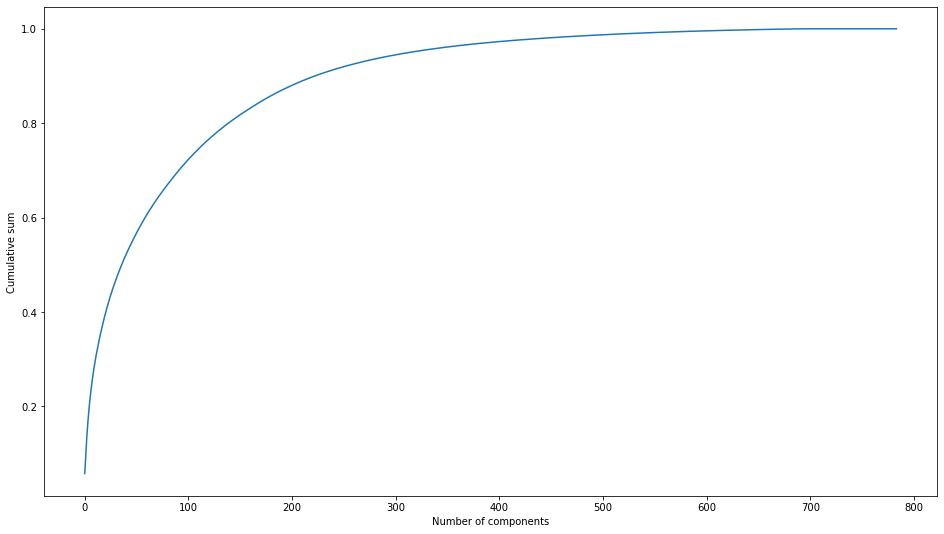

In [75]:
plt.figure(figsize = (16, 9))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of components")
plt.ylabel("Cumulative sum")
plt.show()

In [ ]:
"""
I have to choose the number components that can describe 90% of my data. That means I can't use low number of components.
I have to choose very large number of numponents. Then it will recude some features from the original dataframe. So
I can say that yes, it reduces some time, some computational cost but that is not reducing very much. So why PCA is using
so much?
"""

### When PCA does not work

**Blogs:**

- https://towardsdatascience.com/interesting-projections-where-pca-fails-fe64ddca73e6
- https://stats.stackexchange.com/questions/448200/is-pca-always-recommended